07.12 - task


improve architecture and try data augumentation for second class

In [1]:
import numpy as np
import pandas as pd
import os
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras import layers
from tensorflow.keras.regularizers import L2
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, BatchNormalization
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.model_selection import train_test_split


In [2]:
Data_Path = "/content/drive/MyDrive/processed_data"

IMG_SIZE = (48,48)
BATCH_SIZE = 64
SEED = 32

In [49]:
Test_Path = Data_Path + "/test"

In [3]:
import os
import shutil
from sklearn.model_selection import train_test_split

SOURCE_DIR = "/content/drive/MyDrive/processed_data"
TARGET_DIR = "/content/drive/MyDrive/emotion_split"
os.makedirs(TARGET_DIR, exist_ok=True)


In [ ]:
def split_class(class_name):
    src = os.path.join(SOURCE_DIR, class_name)
    all_imgs = os.listdir(src)

    train, temp = train_test_split(all_imgs, test_size=0.3, random_state=42)
    val, test = train_test_split(temp, test_size=0.5, random_state=42)

    print(f"{class_name}: {len(train)} train, {len(val)} val, {len(test)} test")

    for split, filelist in zip(
        ['train', 'val', 'test'],
        [train, val, test]
    ):
        split_path = os.path.join(TARGET_DIR, split, class_name)
        os.makedirs(split_path, exist_ok=True)

        for fname in filelist:
            shutil.copy(
                os.path.join(src, fname),
                os.path.join(split_path, fname)
            )


In [ ]:
for cls in ["happy", "sad"]:
    split_class(cls)


happy: 4547 train, 975 val, 975 test
sad: 4574 train, 980 val, 981 test


In [4]:
train_ds = tf.keras.utils.image_dataset_from_directory(
    Data_Path,
    validation_split=0.2,
    subset="training",
    seed=SEED,
    color_mode="grayscale",
    image_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    label_mode="binary"
)

val_ds = tf.keras.utils.image_dataset_from_directory(
    Data_Path,
    validation_split=0.2,
    subset="validation",
    seed=SEED,
    color_mode="grayscale",
    image_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    label_mode="binary"
)



Found 13032 files belonging to 2 classes.
Using 10426 files for training.
Found 13032 files belonging to 2 classes.
Using 2606 files for validation.


In [5]:
AUTOTUNE = tf.data.AUTOTUNE

train_ds = train_ds.cache().shuffle(1000).prefetch(AUTOTUNE)
val_ds = val_ds.cache().prefetch(AUTOTUNE)


In [6]:
def preprocess(image, label):
    image = tf.cast(image, tf.float32) / 255.0
    return image, label

train_ds = train_ds.map(preprocess, num_parallel_calls=tf.data.AUTOTUNE)
val_ds = val_ds.map(preprocess, num_parallel_calls=tf.data.AUTOTUNE)


In [103]:
model = Sequential([

     Conv2D(6, (3,3), activation = 'relu',  input_shape=(48,48,1)),
     BatchNormalization(),
     MaxPooling2D(2,2),
     Dropout(0.5),

     Conv2D(16, (3,3), activation = 'relu'),
     BatchNormalization(),
     MaxPooling2D(2,2),


     Flatten(),
     Dense(64, activation = 'relu'),
     Dropout(0.5),
     Dense(1, activation='sigmoid')

     ]
)

model.summary()

Model: "sequential_6"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_12 (Conv2D)              │ (None, 46, 46, 6)      │            60 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_12          │ (None, 46, 46, 6)      │            24 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_12 (MaxPooling2D) │ (None, 23, 23, 6)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_12 (Dropout)            │ (None, 23, 23, 6)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_13 (Conv2D)              │ (None, 21, 21, 16)     │           880 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_13          │ (None, 21, 21, 16)     │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_13 (MaxPooling2D) │ (None, 10, 10, 16)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_6 (Flatten)             │ (None, 1600)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_12 (Dense)                │ (None, 64)             │       102,464 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_13 (Dropout)            │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_13 (Dense)                │ (None, 1)              │            65 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 103,557 (404.52 KB)

 Trainable params: 103,513 (404.35 KB)

 Non-trainable params: 44 (176.00 B)

In [104]:
model.compile(
    optimizer='adam',
    loss='binary_crossentropy',
    metrics=['accuracy']
)

In [105]:
callbacks = [
    tf.keras.callbacks.EarlyStopping(monitor='val_loss',patience=5,restore_best_weights=True),
    tf.keras.callbacks.ModelCheckpoint(filepath="checkpoints/epoch_{epoch:02d}.weights.h5",
    save_weights_only=True,
    save_freq='epoch'),
]

In [106]:
class_weights = {0: 2.0, 1: 1.5}

old model

dropout - 0.5\

no class weights

In [107]:
from sklearn.utils import class_weight
history = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=40,
    callbacks=[callbacks],
    class_weight=class_weights

)

Epoch 1/40
163/163 ━━━━━━━━━━━━━━━━━━━━ 20s 106ms/step - accuracy: 0.5894 - loss: 1.3090 - val_accuracy: 0.4812 - val_loss: 1.2480
Epoch 2/40
163/163 ━━━━━━━━━━━━━━━━━━━━ 19s 115ms/step - accuracy: 0.7124 - loss: 0.9451 - val_accuracy: 0.5088 - val_loss: 1.2404
Epoch 3/40
163/163 ━━━━━━━━━━━━━━━━━━━━ 17s 106ms/step - accuracy: 0.7365 - loss: 0.9135 - val_accuracy: 0.6876 - val_loss: 0.7650
Epoch 4/40
163/163 ━━━━━━━━━━━━━━━━━━━━ 17s 105ms/step - accuracy: 0.7475 - loss: 0.8650 - val_accuracy: 0.7801 - val_loss: 0.4488
Epoch 5/40
163/163 ━━━━━━━━━━━━━━━━━━━━ 19s 115ms/step - accuracy: 0.7690 - loss: 0.8146 - val_accuracy: 0.8078 - val_loss: 0.4189
Epoch 6/40
163/163 ━━━━━━━━━━━━━━━━━━━━ 18s 110ms/step - accuracy: 0.7739 - loss: 0.7852 - val_accuracy: 0.8200 - val_loss: 0.3952
Epoch 7/40
163/163 ━━━━━━━━━━━━━━━━━━━━ 18s 110ms/step - accuracy: 0.7866 - loss: 0.7673 - val_accuracy: 0.8016 - val_loss: 0.4215
Epoch 8/40
163/163 ━━━━━━━━━━━━━━━━━━━━ 17s 105ms/step - accuracy: 0.8019 - loss: 0

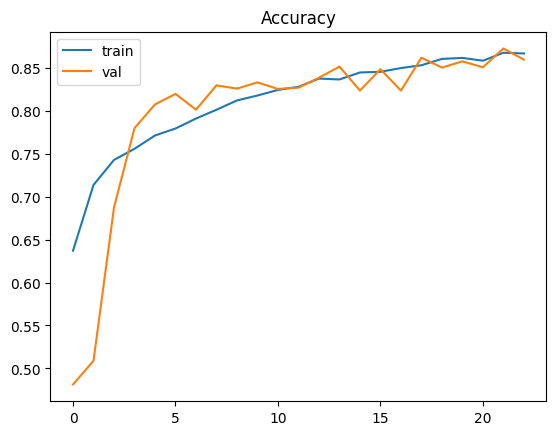

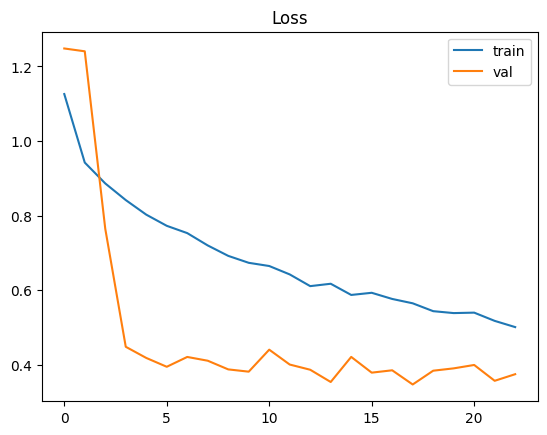

In [108]:
import matplotlib.pyplot as plt

plt.plot(history.history['accuracy'], label='train')
plt.plot(history.history['val_accuracy'], label='val')
plt.title('Accuracy')
plt.legend()
plt.show()

plt.plot(history.history['loss'], label='train')
plt.plot(history.history['val_loss'], label='val')
plt.title('Loss')
plt.legend()
plt.show()


***test_start***

In [44]:
test_model = model

test_model.load_weights("/content/checkpoints/epoch_17.weights.h5")

In [55]:
test_model.evaluate(test_ds)

31/31 ━━━━━━━━━━━━━━━━━━━━ 162s 5s/step - accuracy: 0.6766 - loss: 26.9371


[18.036779403686523, 0.7791411280632019]

In [45]:
import tensorflow as tf
import cv2
import numpy as np
from google.colab import files
from google.colab.patches import cv2_imshow

def predict_selfie(model):
    uploaded = files.upload()
    img_path = list(uploaded.keys())[0]

    img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)

    img_resized = cv2.resize(img, (48, 48))

    cv2_imshow(img_resized)

    img_resized = img_resized.astype('float32') / 255.0

    img_input = np.expand_dims(img_resized, axis=0)
    img_input = np.expand_dims(img_input, axis=-1)

    pred = model.predict(img_input)[0][0]

    if pred > 0.5:
        print(f"Prediction: Happy ({pred:.2f})")
    else:
        print(f"Prediction: Not-Happy ({pred:.2f})")


In [ ]:
predict_selfie(test_model)


***test_end***



In [54]:

test_ds = tf.keras.preprocessing.image_dataset_from_directory(
    "/content/drive/MyDrive/emotion_split/test",
    label_mode="binary",
    image_size=(IMG_SIZE),
    color_mode="grayscale",
    batch_size=BATCH_SIZE,
    shuffle=False
)


Found 1956 files belonging to 2 classes.


In [109]:
y_true = np.concatenate([y for x, y in test_ds], axis=0)
y_pred = test_model.predict(test_ds)

# If binary classification
y_pred_labels = (y_pred > 0.5).astype("int32")


31/31 ━━━━━━━━━━━━━━━━━━━━ 7s 238ms/step


In [111]:
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y_true, y_pred_labels)
print(cm)


[[943  32]
 [455 526]]


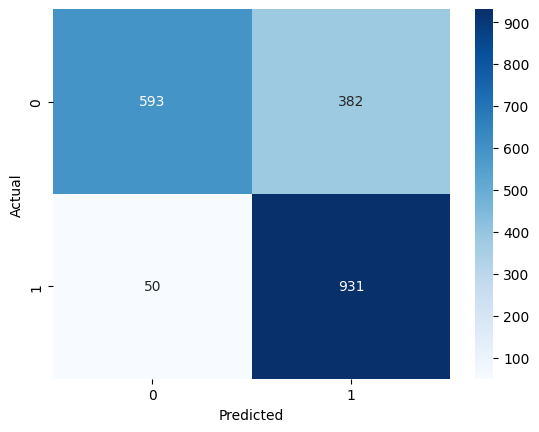

In [69]:
import seaborn as sns

sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()


In [75]:
from sklearn.metrics import classification_report

print(classification_report(y_true, y_pred_labels))


              precision    recall  f1-score   support

         0.0       0.92      0.61      0.74       975
         1.0       0.71      0.95      0.81       981

    accuracy                           0.78      1956
   macro avg       0.82      0.78      0.77      1956
weighted avg       0.82      0.78      0.77      1956



In [73]:
class_accuracy = cm.diagonal() / cm.sum(axis=1)
print("Per-class accuracy:", class_accuracy)


Per-class accuracy: [0.61230769 0.94801223]


In [65]:
y_true = np.concatenate([y for x, y in test_ds], axis=0)

y_pred = test_model.predict(test_ds)

y_pred_labels = (y_pred > 0.5).astype("int32")

file_paths = np.array(test_ds.file_paths)


31/31 ━━━━━━━━━━━━━━━━━━━━ 6s 206ms/step


In [66]:
wrong_idx = np.where(y_pred_labels.reshape(-1) != y_true.reshape(-1))[0]


/tmp/ipython-input-882931034.py:7: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  plt.title(f"True: {int(y_true[idx])}, Pred: {int(y_pred_labels[idx])}")


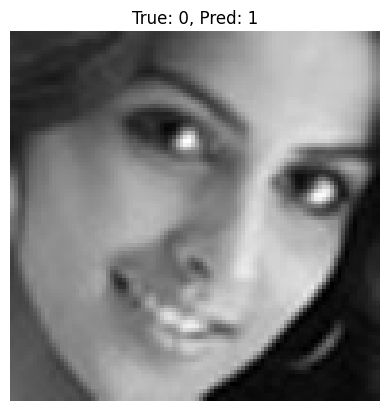

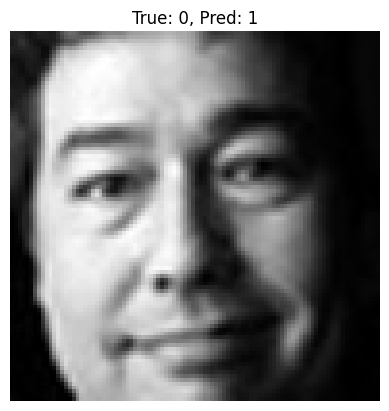

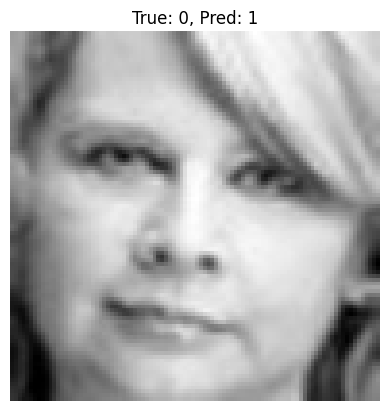

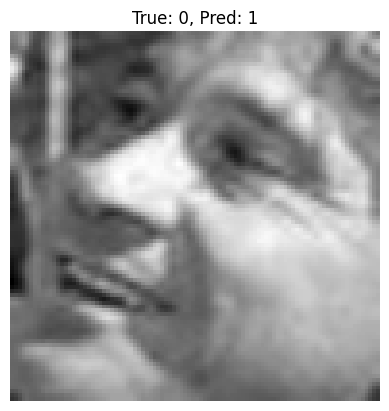

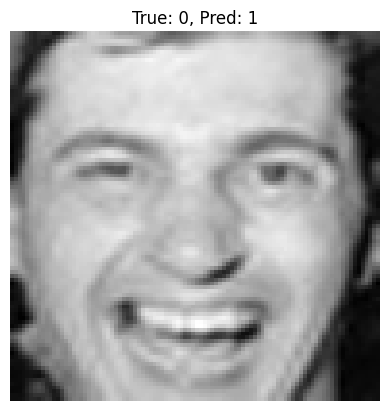

...

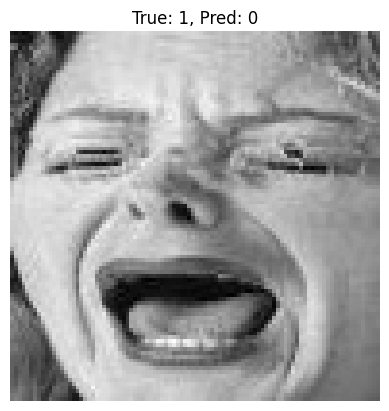

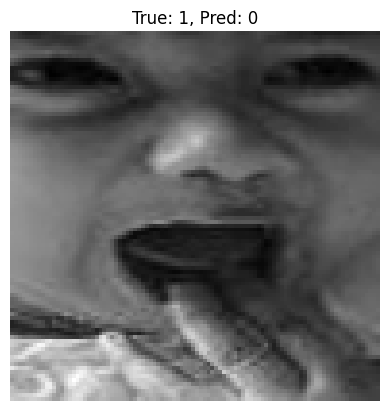

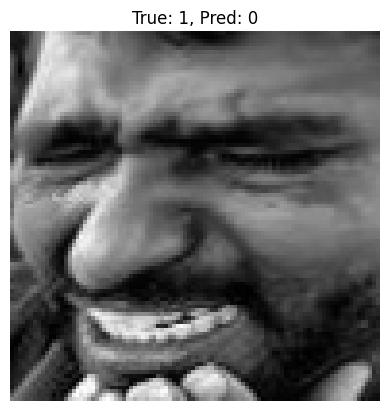

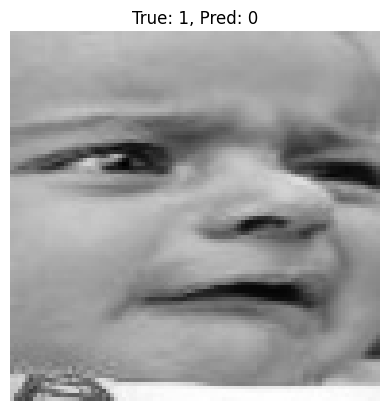

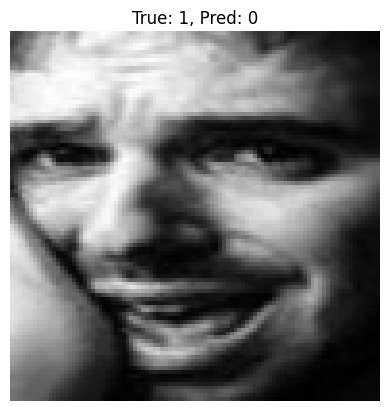

In [68]:
import matplotlib.pyplot as plt
import tensorflow as tf

for idx in wrong_idx:
    img = tf.keras.utils.load_img(file_paths[idx], color_mode="grayscale")
    plt.imshow(img, cmap="gray")
    plt.title(f"True: {int(y_true[idx])}, Pred: {int(y_pred_labels[idx])}")
    plt.axis("off")
    plt.show()
